# Train Your DreamBooth Model

In [1]:
%cd /home/ubuntu/dreambooth
SD_NAME="CompVis/stable-diffusion-v1-4" # If you downloaded our model cache, then set it to where it is. e.g. "/home/models--CompVis--stable-diffusion-v1-4/snapshots/114c79c111c5836a89768787ba5b4ceee25bb734"

INPUT_DIR="/home/ubuntu/data" # This is the path to input training photos

!rm -rf "${INPUT_DIR}/.ipynb_checkpoints" # Some times notebook saves checkpoints in the data and that causes problems.

/home/ubuntu/dreambooth


In [2]:
TOKEN="aabbccddeeffgg"
INSTANCE_PROMPT="a photo of " + TOKEN + " person"
VALIDATION_PROMPT= "photo portrait of  " + TOKEN + " astronaut, astronaut, helmet in alien world abstract oil painting, greg rutkowski, detailed face"

In [3]:
# Login wandb account
import wandb
wandb.login()

wandb: Currently logged in as: chuanli11. Use `wandb login --relogin` to force relogin


True

In [4]:
# Default

MODEL_DIR="/home/ubuntu/model_default"
!mkdir -p "$MODEL_DIR"

MAX_NUM_STEPS=500
BATCH_SIZE=2
LR=1e-6
RESOLUTION=512
SEED=95131
REPORT_TO="wandb"

!(accelerate launch  --gpu_ids 0 train_dreambooth.py \
  --pretrained_model_name_or_path=$SD_NAME \
  --train_text_encoder \
  --center_crop \
  --instance_data_dir=$INPUT_DIR \
  --output_dir=$MODEL_DIR \
  --instance_prompt="$INSTANCE_PROMPT" \
  --resolution=$RESOLUTION \
  --train_batch_size=$BATCH_SIZE \
  --gradient_checkpointing \
  --learning_rate=$LR \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps=$MAX_NUM_STEPS \
  --enable_xformers_memory_efficient_attention \
  --mixed_precision=fp16 \
  --report_to=$REPORT_TO \
  --validation_prompt="$VALIDATION_PROMPT" \
  --num_validation_images=4 \
  --validation_steps=100 \
  --seed=$SEED \
)

In [5]:
# 8-bit Adam

MODEL_DIR="/home/ubuntu/model_8bit_adam"
!mkdir -p "$MODEL_DIR"

MAX_NUM_STEPS=500
BATCH_SIZE=2
LR=1e-6
RESOLUTION=512
SEED=95131
REPORT_TO="wandb"

!(accelerate launch  --gpu_ids 0 train_dreambooth.py \
  --pretrained_model_name_or_path=$SD_NAME \
  --train_text_encoder \
  --center_crop \
  --instance_data_dir=$INPUT_DIR \
  --output_dir=$MODEL_DIR \
  --instance_prompt="$INSTANCE_PROMPT" \
  --resolution=$RESOLUTION \
  --train_batch_size=$BATCH_SIZE \
  --gradient_checkpointing \
  --learning_rate=$LR \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps=$MAX_NUM_STEPS \
  --enable_xformers_memory_efficient_attention \
  --mixed_precision=fp16 \
  --report_to=$REPORT_TO \
  --validation_prompt="$VALIDATION_PROMPT" \
  --num_validation_images=4 \
  --validation_steps=100 \
  --seed=$SEED \
  --use_8bit_adam \
)

In [ ]:
# no train_text_encoder

MODEL_DIR="/home/ubuntu/model_notext"
!mkdir -p "$MODEL_DIR"

MAX_NUM_STEPS=500
BATCH_SIZE=2
LR=1e-6
RESOLUTION=512
SEED=95131
REPORT_TO="wandb"

!(accelerate launch  --gpu_ids 0 train_dreambooth.py \
  --pretrained_model_name_or_path=$SD_NAME \
  --center_crop \
  --instance_data_dir=$INPUT_DIR \
  --output_dir=$MODEL_DIR \
  --instance_prompt="$INSTANCE_PROMPT" \
  --resolution=$RESOLUTION \
  --train_batch_size=$BATCH_SIZE \
  --gradient_checkpointing \
  --learning_rate=$LR \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps=$MAX_NUM_STEPS \
  --enable_xformers_memory_efficient_attention \
  --mixed_precision=fp16 \
  --report_to=$REPORT_TO \
  --validation_prompt="$VALIDATION_PROMPT" \
  --num_validation_images=4 \
  --validation_steps=100 \
  --seed=$SEED \
)

In [6]:
# no train_text_encoder + 8bit_adam

MODEL_DIR="/home/ubuntu/model_notext_8bit"
!mkdir -p "$MODEL_DIR"

MAX_NUM_STEPS=500
BATCH_SIZE=2
LR=1e-6
RESOLUTION=512
SEED=95131
REPORT_TO="wandb"

!(accelerate launch  --gpu_ids 0 train_dreambooth.py \
  --pretrained_model_name_or_path=$SD_NAME \
  --center_crop \
  --instance_data_dir=$INPUT_DIR \
  --output_dir=$MODEL_DIR \
  --instance_prompt="$INSTANCE_PROMPT" \
  --resolution=$RESOLUTION \
  --train_batch_size=$BATCH_SIZE \
  --gradient_checkpointing \
  --learning_rate=$LR \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps=$MAX_NUM_STEPS \
  --enable_xformers_memory_efficient_attention \
  --mixed_precision=fp16 \
  --report_to=$REPORT_TO \
  --validation_prompt="$VALIDATION_PROMPT" \
  --num_validation_images=4 \
  --validation_steps=100 \
  --seed=$SEED \
  --use_8bit_adam \
)

2023-07-31 03:32:36.330778: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX512F AVX512_VNNI
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-31 03:32:36.447540: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
--------------------------------------------------------------------------
detected:

  Local host:            192-9-129-166
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4126

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_op

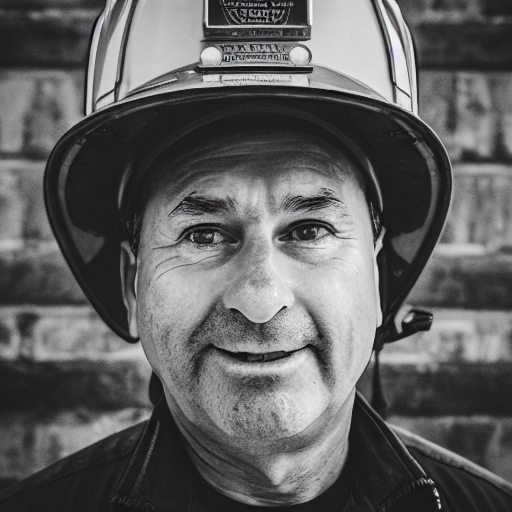

/home/ubuntu/output_default/2-rutkowskiartgem-20230731-033257.png


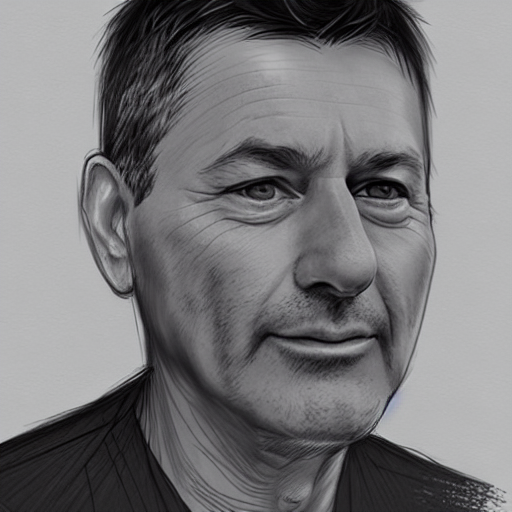

/home/ubuntu/output_default/3-longhair-20230731-033303.png


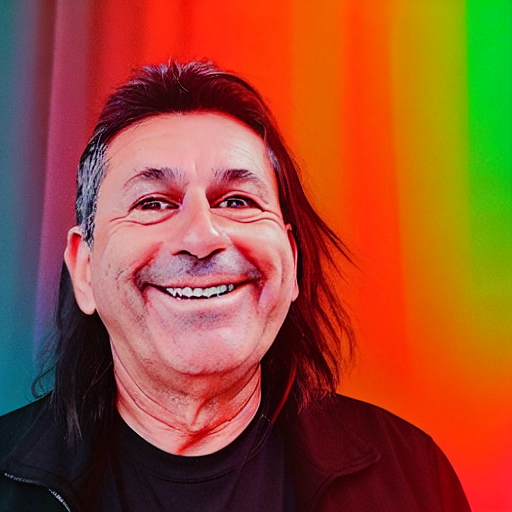

/home/ubuntu/output_default/1-rutkowski-20230731-033251.png


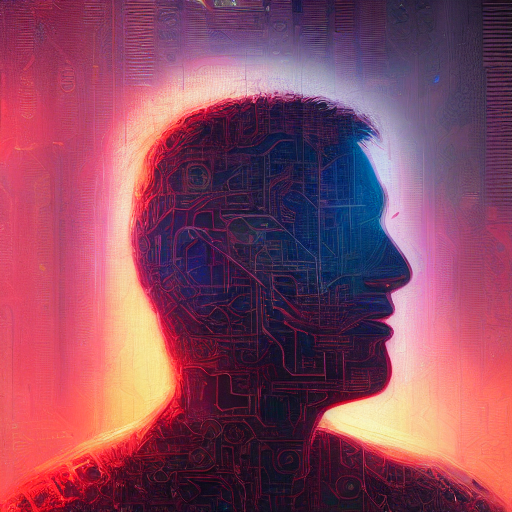

/home/ubuntu/output_default/6-steampunk-20230731-033323.png


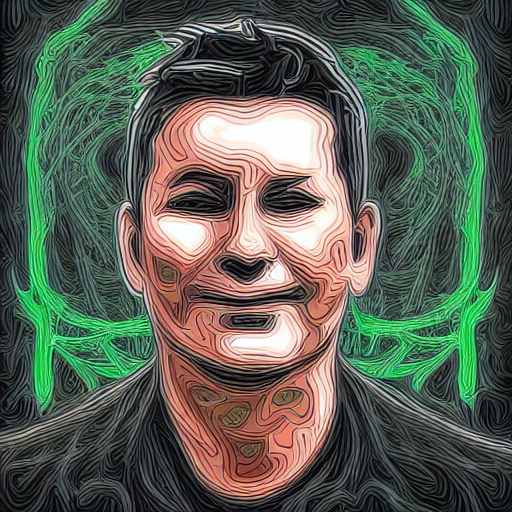

/home/ubuntu/output_default/7-danielgerhartz-20230731-033329.png


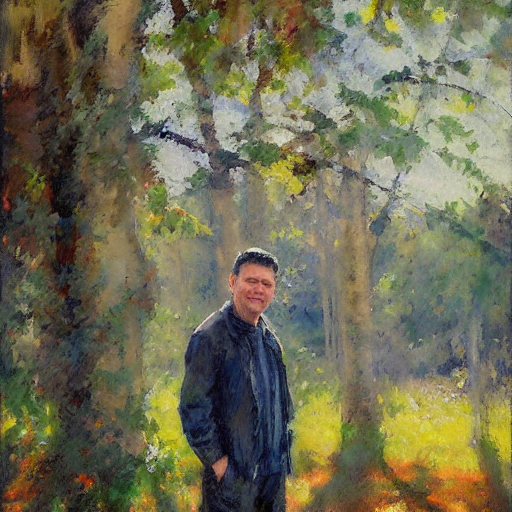

/home/ubuntu/output_default/4-astronautrutkowski-20230731-033310.png


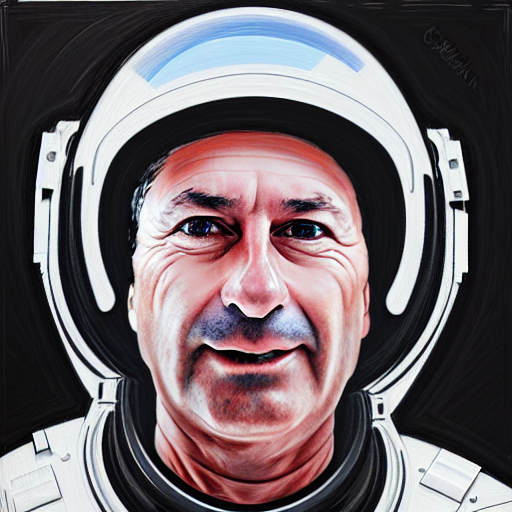

In [7]:
# Inference (results will be saved to PRED_DIR)
MODEL_DIR="/home/ubuntu/model_default"
PRED_DIR="/home/ubuntu/output_default" # This is the path to save the predicted images
!mkdir -p "$PRED_DIR"

NUM_PRED=1 # number of predictions per prompt
!( python test_dreambooth.py \
    --model_path $MODEL_DIR \
    --pred_path $PRED_DIR \
    --num_preds $NUM_PRED \
    --ddim \
    --token $TOKEN \
)

import glob
from IPython.display import Image, display
for imageName in glob.glob(PRED_DIR +'/*.png'):
    print(imageName)
    display(Image(filename=imageName))

2023-07-31 03:33:32.457054: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX512F AVX512_VNNI
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-31 03:33:32.574926: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
--------------------------------------------------------------------------
detected:

  Local host:            192-9-129-166
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4126

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_op

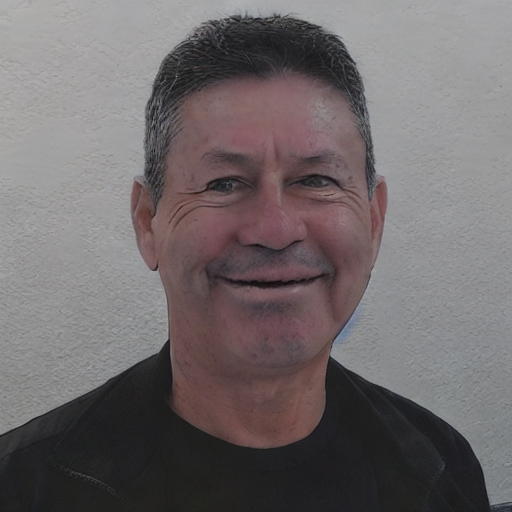

/home/ubuntu/output_8bit_adam/3-longhair-20230731-033400.png


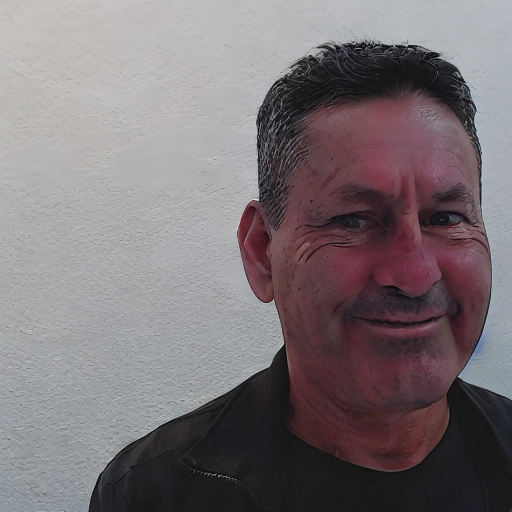

/home/ubuntu/output_8bit_adam/6-steampunk-20230731-033419.png


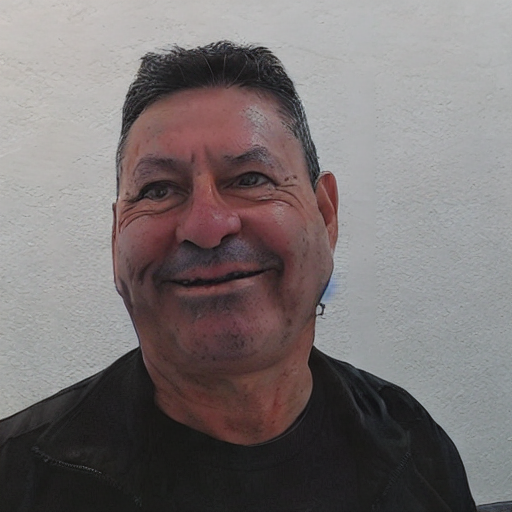

/home/ubuntu/output_8bit_adam/1-rutkowski-20230731-033347.png


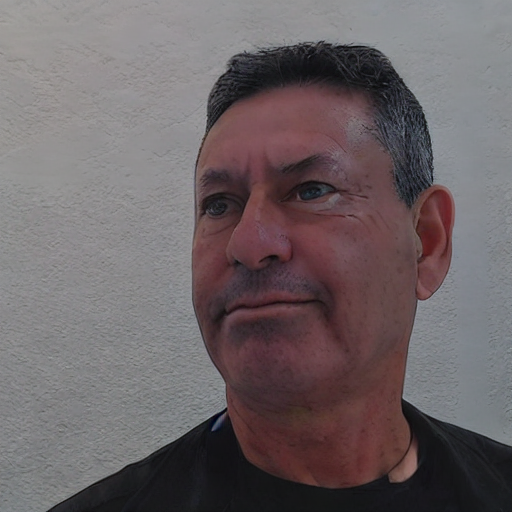

/home/ubuntu/output_8bit_adam/4-astronautrutkowski-20230731-033406.png


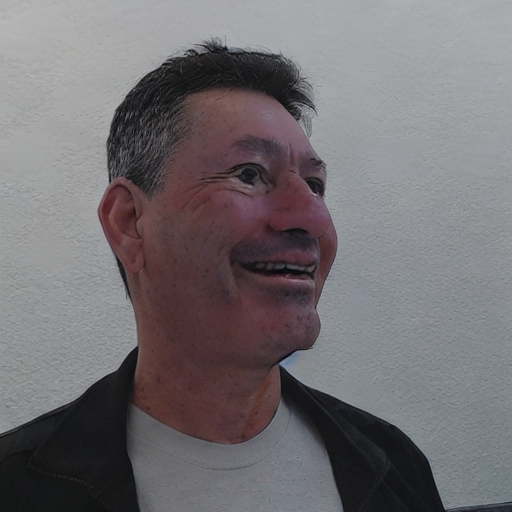

/home/ubuntu/output_8bit_adam/5-firefighter-20230731-033413.png


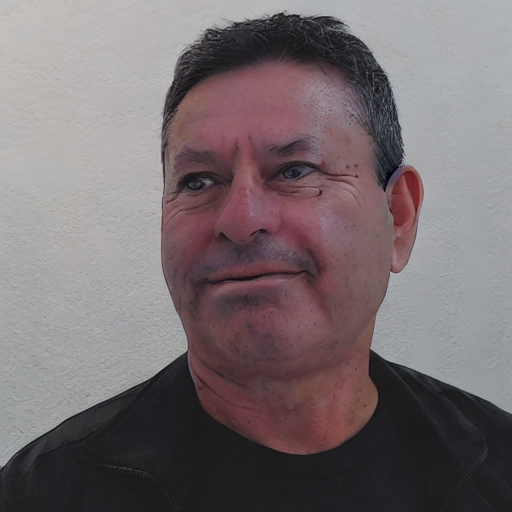

/home/ubuntu/output_8bit_adam/7-danielgerhartz-20230731-033426.png


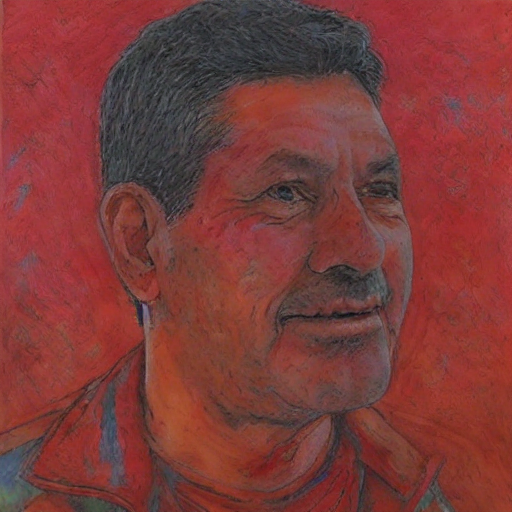

In [8]:
# Inference (results will be saved to PRED_DIR)
MODEL_DIR="/home/ubuntu/model_8bit_adam"
PRED_DIR="/home/ubuntu/output_8bit_adam" # This is the path to save the predicted images
!mkdir -p "$PRED_DIR"

NUM_PRED=1 # number of predictions per prompt
!( python test_dreambooth.py \
    --model_path $MODEL_DIR \
    --pred_path $PRED_DIR \
    --num_preds $NUM_PRED \
    --ddim \
    --token $TOKEN \
)

import glob
from IPython.display import Image, display
for imageName in glob.glob(PRED_DIR +'/*.png'):
    print(imageName)
    display(Image(filename=imageName))

2023-07-31 04:38:40.119006: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX512F AVX512_VNNI
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-31 04:38:40.235379: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
--------------------------------------------------------------------------
detected:

  Local host:            192-9-129-166
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4126

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_op

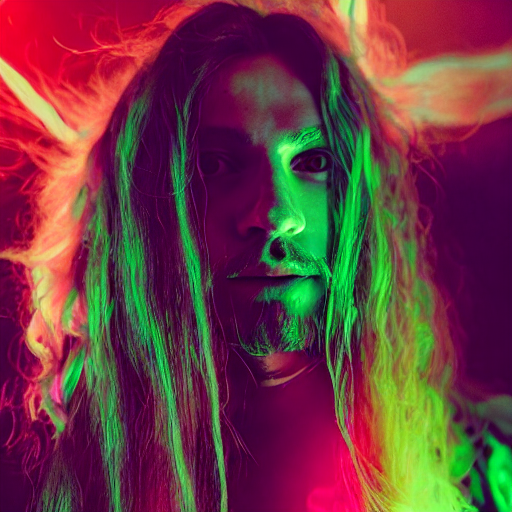

/home/ubuntu/output_notext/6-steampunk-20230731-043924.png


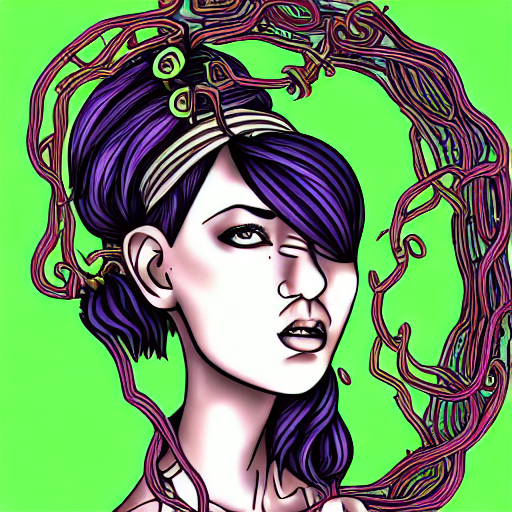

/home/ubuntu/output_notext/1-rutkowski-20230731-043852.png


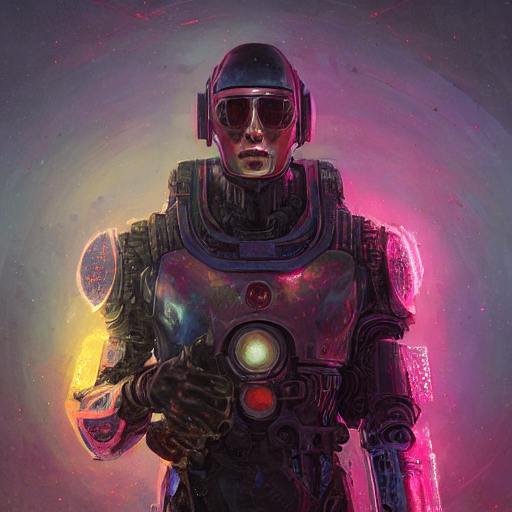

/home/ubuntu/output_notext/4-astronautrutkowski-20230731-043911.png


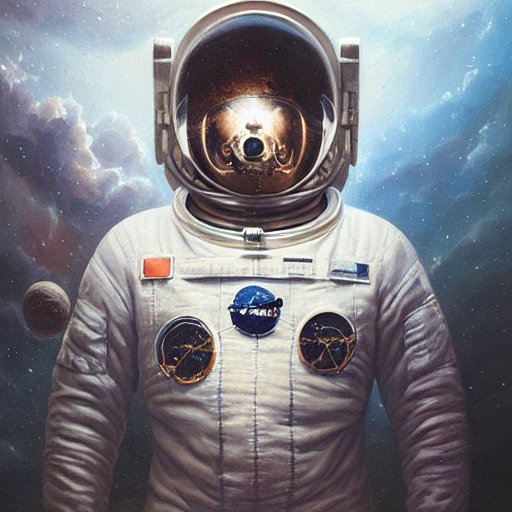

/home/ubuntu/output_notext/7-danielgerhartz-20230731-043930.png


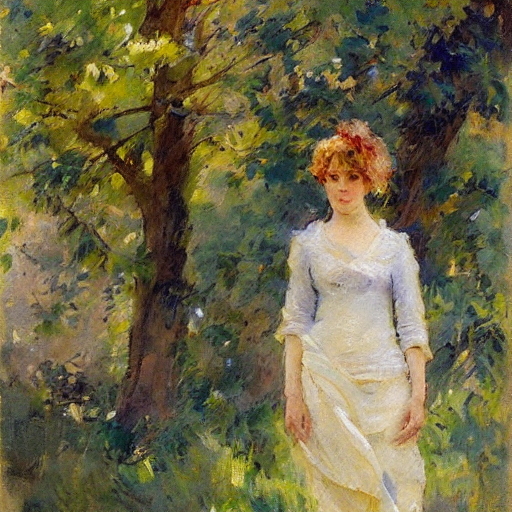

/home/ubuntu/output_notext/5-firefighter-20230731-043917.png


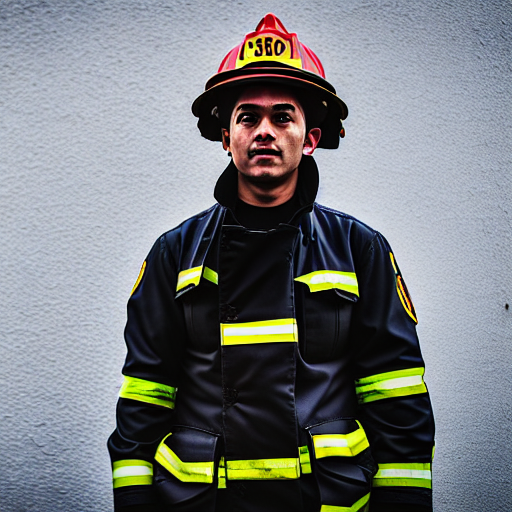

/home/ubuntu/output_notext/2-rutkowskiartgem-20230731-043858.png


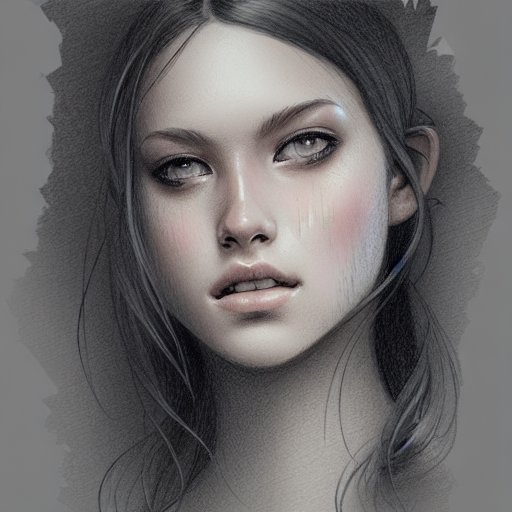

In [11]:
# Inference (results will be saved to PRED_DIR)
MODEL_DIR="/home/ubuntu/model_notext"
PRED_DIR="/home/ubuntu/output_notext" # This is the path to save the predicted images
!mkdir -p "$PRED_DIR"

NUM_PRED=1 # number of predictions per prompt
!( python test_dreambooth.py \
    --model_path $MODEL_DIR \
    --pred_path $PRED_DIR \
    --num_preds $NUM_PRED \
    --ddim \
    --token $TOKEN \
)

import glob
from IPython.display import Image, display
for imageName in glob.glob(PRED_DIR +'/*.png'):
    print(imageName)
    display(Image(filename=imageName))

2023-07-31 03:34:29.042341: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX512F AVX512_VNNI
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-31 03:34:29.160102: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
--------------------------------------------------------------------------
detected:

  Local host:            192-9-129-166
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4126

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_op

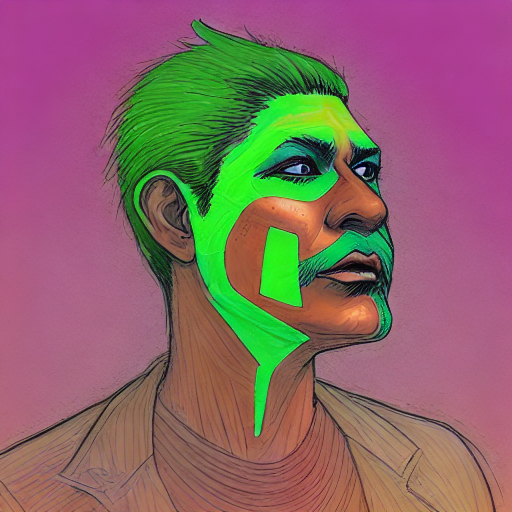

/home/ubuntu/output_notext/4-astronautrutkowski-20230731-033502.png


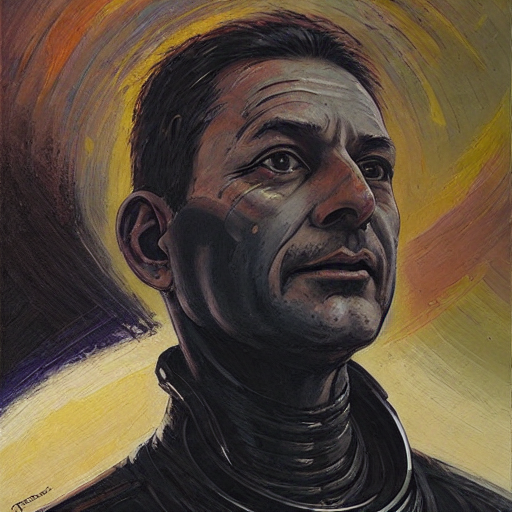

/home/ubuntu/output_notext/2-rutkowskiartgem-20230731-033449.png


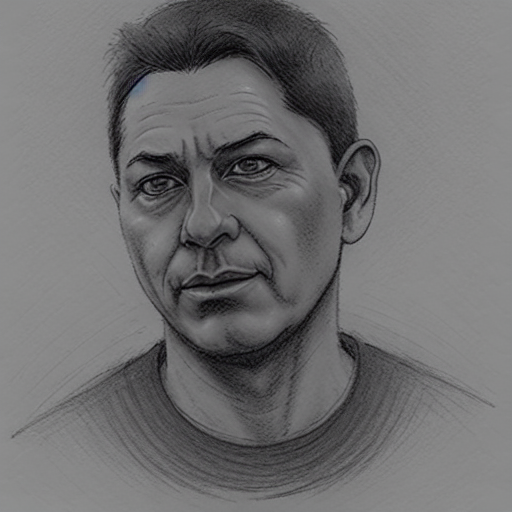

/home/ubuntu/output_notext/7-danielgerhartz-20230731-033522.png


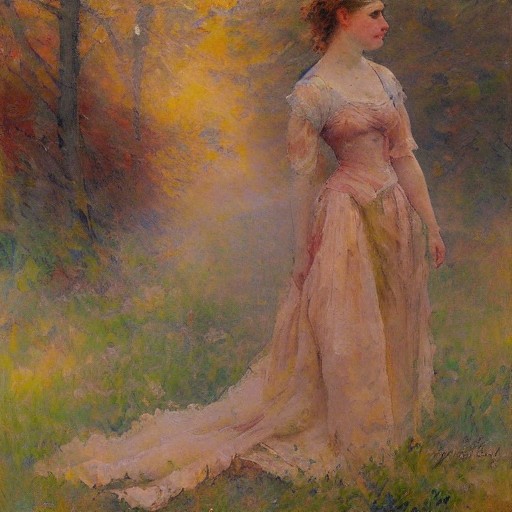

/home/ubuntu/output_notext/3-longhair-20230731-033456.png


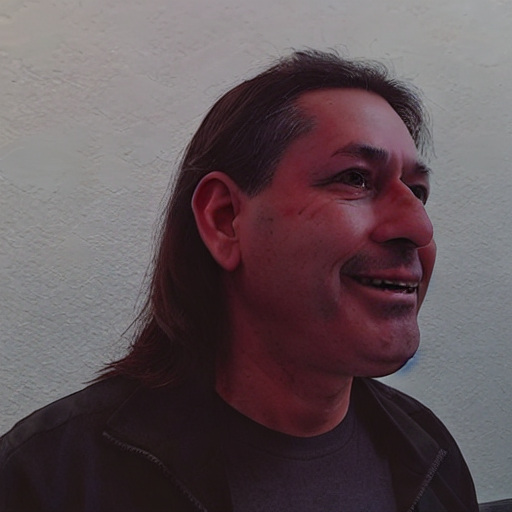

/home/ubuntu/output_notext/1-rutkowski-20230731-033443.png


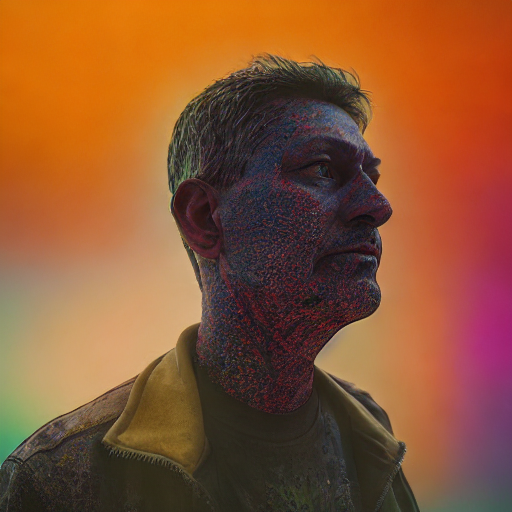

/home/ubuntu/output_notext/5-firefighter-20230731-033509.png


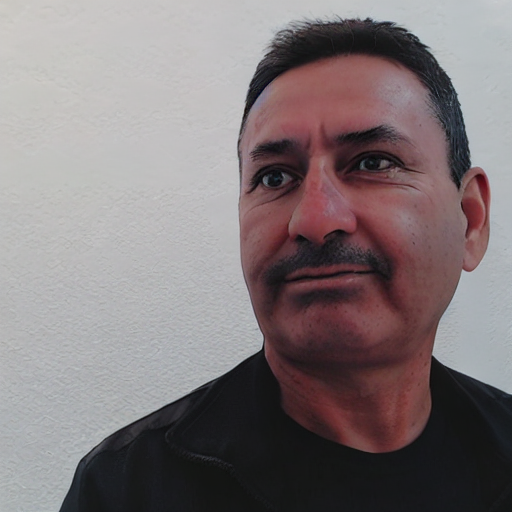

In [9]:
# Inference (results will be saved to PRED_DIR)
MODEL_DIR="/home/ubuntu/model_notext_8bit"
PRED_DIR="/home/ubuntu/output_notext_8bit" # This is the path to save the predicted images
!mkdir -p "$PRED_DIR"

NUM_PRED=1 # number of predictions per prompt
!( python test_dreambooth.py \
    --model_path $MODEL_DIR \
    --pred_path $PRED_DIR \
    --num_preds $NUM_PRED \
    --ddim \
    --token $TOKEN \
)

import glob
from IPython.display import Image, display
for imageName in glob.glob(PRED_DIR +'/*.png'):
    print(imageName)
    display(Image(filename=imageName))